# 統計學習初論 (Spring, 2019)¶

# Homework 4

截止日期: 9AM, 2019/4/30
    
請將HTML檔上傳至Ceiba作業區。回答作業時建議使用 "三明治" 答題法。也就是說，先說明要做什麼，然後列出程式碼與結果，最後說明這些結果的意義。作業自己做。嚴禁抄襲。不接受紙本繳交，不接受遲交。請以英文或中文作答。

Data Visualization via Dimensionality Reduction
Data visualization is an useful technique that is often used to understand the characteristics of a dataset. We are going to practice this skill using a university department offer of admission dataset.

Dataset: University Department Offer of Admission Dataset (UDOAD; 大學推薦甄選資料集)
A large portion of high school students get admitted to universities through an application and screening process that require each university department of offer admission to applicants first before students can choose where they wants to go. If we think of applicants as the customers of an academic department, then the duplications of offered applicants for different departments can be used to understand the competition relationships between academic departments. We are going to visualize this competition relationships using the University Department Offer of Admission Dataset (UDOAD).

UDOAD was collected through a popular online offer searching service (https://freshman.tw/) for the 2017 academic year. We collected the offers recieved by each applicant as well as the basic information for academic departments. This dataset contains two files

student_admission106.csv: the offers received by each student applicant.
    
univ_name106short1.csv: the basic information, such as the name and field of academic departments.
    
Below is the first few records of these two files:

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd

stu_adm = pd.read_csv('ds/student_admission106.csv', encoding="utf-8", dtype=str)
uname = pd.read_csv('ds/univ_name106short1.csv', encoding="utf-8", dtype=str)

all_depid = stu_adm['department_id'].unique()
all_stuid = stu_adm['student_id'].unique()

ndepid = all_depid.shape[0]
nstuid = all_stuid.shape[0]
print("There are %d students and %d departments in total." % (nstuid, ndepid))

print("offers received by students:")
stu_adm.head(10)

There are 60461 students and 1976 departments in total.
offers received by students:


,school_id,department_id,student_id,student_name,state,location1,location2
0,001,001012,10246842,黃士玹,正1,南部,台南考區
1,001,001012,10042237,黃冠婷,正2,北部,台北考區
2,001,001012,10008031,鍾大方,正3,北部,台北考區
3,001,001012,10201525,曾信豪,正4,中部,彰化考區
4,001,001012,10014615,陳品儒,正5,北部,台北考區
5,001,001012,10294018,侯思筠,正6,東部,宜蘭考區
6,001,001012,10022810,吳悅慈,正7,北部,台北考區
7,001,001012,10236223,陳俞潔,正8,南部,台南考區
8,001,001012,10025909,蕭宇廷,正9,北部,台北考區
9,001,001012,10123708,吳岱軒,正10,北部,中壢考區


The department_id can uniquely identify an academic department. We do not care about the ranking of admission here, and you should just ignore the "state" column. We only care about the "co-application" relations in this dataset. You should use student_id to uniquely identify a student applicant.

In [2]:
print("academic department basic information:")
uname.head(10)

academic department basic information:


,year,school_id,department_id,school_name,department_name,category_id,category_name,school_name_abbr,department_name_abbr
0,106,006,006042,國立政治大學,教育學系,1,教育,政大,教育
1,106,006,006052,國立政治大學,教育學系(公費生),1,教育,政大,教育(公)
2,106,006,006062,國立政治大學,教育學系(原住民公費生),1,教育,政大,教育(原住民)
3,106,006,006022,國立政治大學,歷史學系,2,藝術及人文,政大,歷史
4,106,006,006152,國立政治大學,民族學系,2,藝術及人文,政大,民族學
5,106,006,006032,國立政治大學,哲學系,2,藝術及人文,政大,哲學
6,106,006,006262,國立政治大學,英國語文學系,2,藝術及人文,政大,英國語文
7,106,006,006292,國立政治大學,日本語文學系,2,藝術及人文,政大,日本語文
8,106,006,006272,國立政治大學,阿拉伯語文學系,2,藝術及人文,政大,阿拉伯語文
9,106,006,006302,國立政治大學,韓國語文學系,2,藝術及人文,政大,韓國語文


You can use this dataset to identify the name of a department_id. The school_name and department_name contain the "full name" of a academic department. To facilitate visualization, we also provide "shorter names" in school_name_abbr and department_name_abbr. The category_name is the field of an academic department. This field is very important in our visualization exercise since you should color each data point according to its category_name.

Implementation Restriction
You are allowed to use any Python libraries in your solution.

Question 1 [Data Preparation]

(20%) Our focus is the relationships between department. In order to do this we need to convert the raw data into a "matrix" representation. Each row represent an academic department, and each column represent a student applicant. The value of the cell is 1 if a student applied for admission to the corresponding academic department, and 0 otherwise.

To avoid potential numerical problems, we only include an academic department if it received ten or more applications. Moreover, we only include a student applicant if he or she applied for more than one academic department. You need to make sure that both conditions are satisfied in your processed dataset.

Note that the two conditions should be satisfied "as is" in your final dataset. For example, if a student applied for two departments in the original dataset, and one of the department was removed, then this student should be removed as well because the student only applied for one department in the processed dataset.

Answer the following question:

Q1.1: Report the number of academic department and student applicants in your dataset.
    
Q1.2: Report the top ten departments that recieved the most applications and the number of applications they received. Identify the department by their department_id and names.

In [3]:
#we only include a student applicant if he or she applied for more than one academic department
#and we only include an academic department if it received ten or more applications.
ans=pd.DataFrame(stu_adm["student_id"].value_counts()==1)
del1=ans[ans["student_id"]==True].index
stu_adm=stu_adm[~stu_adm["student_id"].isin(del1)]

In [4]:
ans=pd.DataFrame(stu_adm.groupby("department_id")["student_id"].count()<10)
del2=ans[ans["student_id"]==True].index
stu_adm=stu_adm[~stu_adm["department_id"].isin(del2)]

In [5]:
ans=pd.DataFrame(stu_adm["student_id"].value_counts()==1)
del3=ans[ans["student_id"]==True].index
stu_adm=stu_adm[~stu_adm["student_id"].isin(del3)]

In [6]:
ans=pd.DataFrame(stu_adm.groupby("department_id")["student_id"].count()<10)
del4=ans[ans["student_id"]==True].index
stu_adm=stu_adm[~stu_adm["department_id"].isin(del4)]

In [7]:
ans=pd.DataFrame(stu_adm["student_id"].value_counts()==1)
del5=ans[ans["student_id"]==True].index
stu_adm=stu_adm[~stu_adm["student_id"].isin(del5)]

In [8]:
ans=pd.DataFrame(stu_adm["student_id"].value_counts()==1)
del6=ans[ans["student_id"]==True].index
ans1=pd.DataFrame(stu_adm.groupby("department_id")["student_id"].count()<10)
del7=ans1[ans1["student_id"]==True].index
print(del6)
print(del7)

Index([], dtype='object')
Index([], dtype='object', name='department_id')


In [9]:
#Each row represent an academic department, and each column represent a student applicant.
final=pd.crosstab(stu_adm["department_id"],stu_adm["student_id"])

In [10]:
final

student_id,10000101,10000110,10000111,10000112,10000114,10000116,10000120,10000121,10000125,10000126,...,19710702,19710703,19710708,19710709,19770103,19810104,19810201,19810202,19840201,19950101
department_id,,,,,,,,,,,,,,,,,,,,,
001012,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
001022,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
001032,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
001042,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
001052,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
001062,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
001072,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
001082,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
001092,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [11]:
#Q1.1: Report the number of academic department and student applicants in your dataset.

In [12]:
print("number of acdemic department = ",final.shape[0])
print("number of student applicants = ",final.shape[1])

number of acdemic department =  1917
number of student applicants =  47386


In [13]:
#Q1.2: Report the top ten departments that recieved the most applications and the number of applications they received. 
#Identify the department by their department_id and names.

In [14]:
ans=pd.DataFrame(final.T.sum())
ans=ans.sort_values(0,ascending=False)
ans.columns=["the total number of applications"]
ans[:10]

,the total number of applications
department_id,
008122,386
012052,376
046032,367
004382,357
008112,353
005192,353
005182,351
015342,340
045012,339


In [15]:
mapping=uname[["department_id","department_name"]]

In [16]:
ans=pd.merge(ans[:10],mapping, on='department_id')
ans

,department_id,the total number of applications,department_name
0,008122,386,機械工程學系
1,012052,376,藥學系
2,046032,367,會計學系（臺北校區）
3,004382,357,電機工程學系
4,008112,353,土木工程學系
5,005192,353,企業管理學系
6,005182,351,會計學系
7,015342,340,財務金融學系
8,045012,339,電機工程學系
9,015222,329,資訊工程學系


Question 2 [Explore]

(50%) Visualize academic departments in the following questions. In all plots, you should color data points according the academic department's category. Moreover, you should provide a legend or a picture that illustrate the mapping between colors and category names. Visualize the data using two-dimensional plots. Note that it is your responsible to study the document of libraries of your choice and make sure that the results are reasonable.

Q2.1: Visualize academic departments using the first 8 principle components. Use your judegement to select multiple pairs of principle components to visualize. Discuss the visual patterns with respect to department categories.

In [16]:
from sklearn.decomposition import PCA 
pca=PCA(n_components=8)
pcadata=pca.fit_transform(final)
pcadata=pd.DataFrame(pcadata)
pcadata.index=final.index

In [17]:
newdata=pd.merge(pcadata,uname[["department_id","category_name"]],on='department_id')
newdata=newdata.set_index("department_id")
newdata.columns=["PCA1","PCA2","PCA3","PCA4","PCA5","PCA6","PCA7","PCA8","category_name"]
newdata.head(5)

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,category_name
department_id,,,,,,,,,
001012,-0.031636,-0.011940,-0.182499,-0.035409,0.106112,-0.062083,-0.090061,-0.023065,藝術及人文
001022,0.195955,-0.013883,-0.239607,-0.071906,0.145661,-0.123968,-0.225420,-0.144445,藝術及人文
001032,-0.037276,-0.012666,-0.208549,-0.054053,0.094663,-0.052584,-0.106204,-0.046280,藝術及人文
001042,0.004163,-0.019383,-0.167917,-0.048765,0.072519,-0.038987,-0.094380,-0.004167,藝術及人文
001052,-0.015234,-0.001853,-0.154895,-0.029159,0.083806,-0.048140,-0.074415,-0.013481,藝術及人文


In [18]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [23]:
from matplotlib.font_manager import FontProperties
import seaborn as sns
sns.set(font=['sans-serif'])
sns.set_style("whitegrid",{"font.sans-serif":['Microsoft JhengHei']})

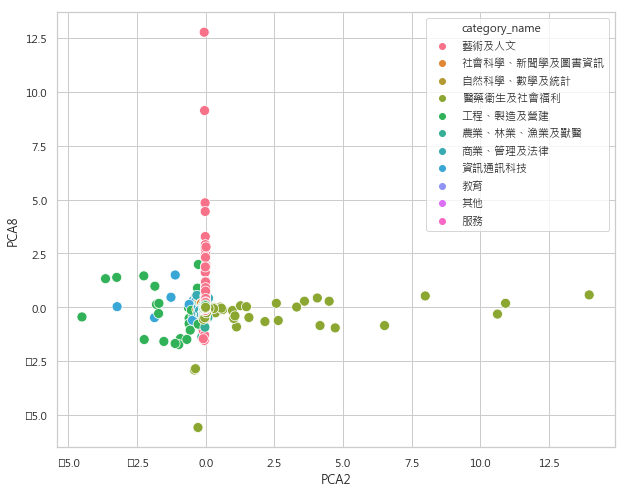

In [20]:
plt.figure(figsize=(10,8))
sns.scatterplot(x="PCA2", y="PCA8", s=100,data=newdata,hue="category_name")
#以這兩個pc當做x,y軸可以把領域類型大致分成3個區塊(藝術人文類，工程製造營建類和醫藥衛生及社會福利類)
#此外左半邊的藍色跟深綠色領域可能性質比較接近，所以在空間上接近且有一些重疊

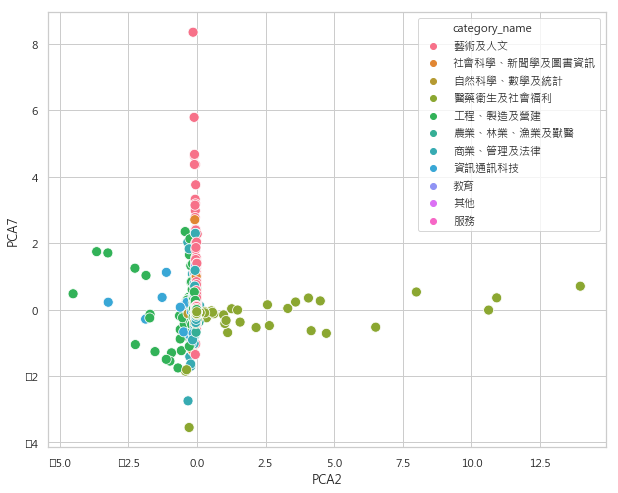

In [21]:
plt.figure(figsize=(10,8))
sns.scatterplot(x="PCA2", y="PCA7", s=100,data=newdata,hue="category_name")
#以這兩個pc當做x,y軸時，跟前一張圖的分布情況類似

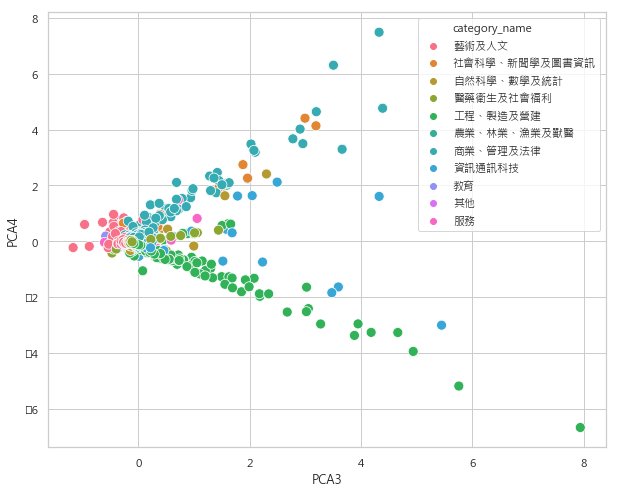

In [22]:
plt.figure(figsize=(10,8))
sns.scatterplot(x="PCA3", y="PCA4", s=100,data=newdata,hue="category_name")
#跟前兩張圖不同，此時藝術及人文領域是分布在左側且自成一團(前面兩張圖都是排成一直線的情況)
#此外這張圖也把領域類型大致分成3個區塊(呈現三角形)(其中一類在頂點，另外兩類各佔據三角形的一邊)
#但是大部分的領域還是集中在(0,0)這個位置附近

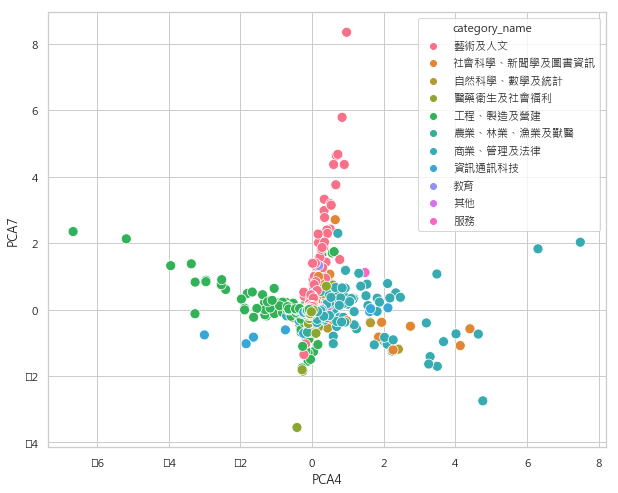

In [23]:
plt.figure(figsize=(10,8))
sns.scatterplot(x="PCA4", y="PCA7", s=100,data=newdata,hue="category_name")
#這對pc也大致把領域分成3類(左側，右側和上半部的粉紅色領域)

Q2.2: Visualize academic department using multiple dimensional scaling. Consdier both the metric and non-metric settings. Discuss the result.

In [24]:
from sklearn.manifold import MDS
mds=MDS(n_components=2,metric=True)
mdsdata=mds.fit_transform(final)
mdsdata=pd.DataFrame(mdsdata)
mdsdata.index=final.index

In [25]:
newdata=pd.merge(mdsdata,uname[["department_id","category_name"]],on='department_id')
newdata=newdata.set_index("department_id")
newdata.head()

,0,1,category_name
department_id,,,
001012,4.158953,4.107749,藝術及人文
001022,-4.703692,-10.089217,藝術及人文
001032,0.338320,7.623514,藝術及人文
001042,-0.051251,-5.058404,藝術及人文
001052,-1.744097,2.079126,藝術及人文


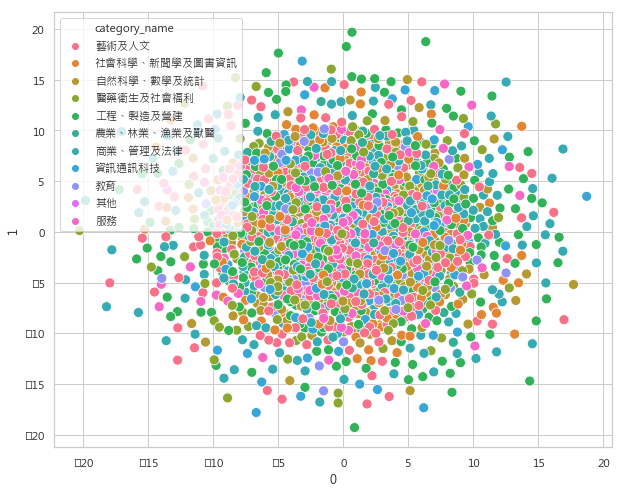

In [26]:
plt.figure(figsize=(10,8)) #metric
sns.scatterplot(x=0, y=1, s=100,data=newdata,hue="category_name")

In [27]:
mds=MDS(n_components=2,metric=False) 
mdsdata=mds.fit_transform(final)
mdsdata=pd.DataFrame(mdsdata)
mdsdata.index=final.index

In [28]:
newdata=pd.merge(mdsdata,uname[["department_id","category_name"]],on='department_id')
newdata=newdata.set_index("department_id")
newdata.head()

,0,1,category_name
department_id,,,
001012,-0.344953,-0.286555,藝術及人文
001022,0.290381,-0.358710,藝術及人文
001032,0.226688,0.237056,藝術及人文
001042,-0.166526,0.207234,藝術及人文
001052,0.023948,0.303738,藝術及人文


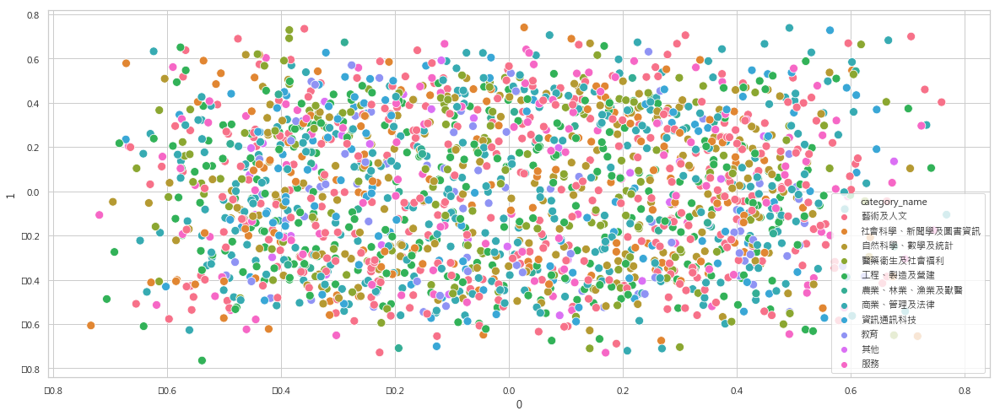

In [29]:
plt.figure(figsize=(20,8)) #non-metric
sns.scatterplot(x=0, y=1, s=100,data=newdata,hue="category_name")

In [30]:
#使用multiple dimensional scaling的方法，不管是metric 還是 non-metric settings ，所有類別都混雜在一起
#不過使用metric方法時，這些資料點的散布情況略呈環狀

Q2.3: Visualize academic department using Locally Linear Embedding. Consider three variations:

(1) Use 20 neighbors to construct the weight matrix

In [31]:
from sklearn.manifold import LocallyLinearEmbedding
embedding = LocallyLinearEmbedding(n_components=2,n_neighbors=20)
lledata=embedding.fit_transform(final)
lledata=pd.DataFrame(lledata)
lledata.index=final.index

In [32]:
newdata=pd.merge(lledata,uname[["department_id","category_name"]],on='department_id')
newdata=newdata.set_index("department_id")
newdata.head()

,0,1,category_name
department_id,,,
001012,-0.001018,0.001064,藝術及人文
001022,-0.000977,0.001200,藝術及人文
001032,-0.001017,0.001058,藝術及人文
001042,-0.001018,0.001066,藝術及人文
001052,-0.001016,0.001073,藝術及人文


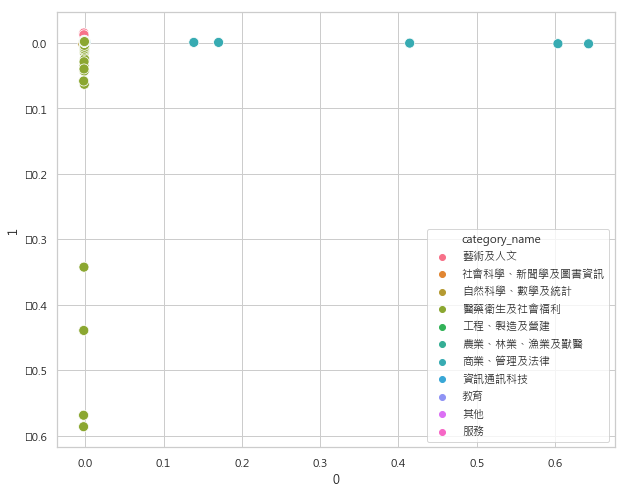

In [33]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=0, y=1, s=100,data=newdata,hue="category_name")

In [34]:
#這張圖也主要把領域分成3類，但與PCA做出來的結果不太相同，所有類別擠在一起的情況比較沒有那麼嚴重

(2) Use 40 neighbors to construct the weight matrix

In [35]:
embedding = LocallyLinearEmbedding(n_components=2,n_neighbors=40,method="modified")
lledata=embedding.fit_transform(final)
lledata=pd.DataFrame(lledata)
lledata.index=final.index

In [36]:
newdata=pd.merge(lledata,uname[["department_id","category_name"]],on='department_id')
newdata=newdata.set_index("department_id")
newdata.head()

,0,1,category_name
department_id,,,
001012,0.001159,-0.001035,藝術及人文
001022,0.001232,0.000437,藝術及人文
001032,0.001237,-0.001148,藝術及人文
001042,0.001161,-0.001040,藝術及人文
001052,0.001168,-0.001048,藝術及人文


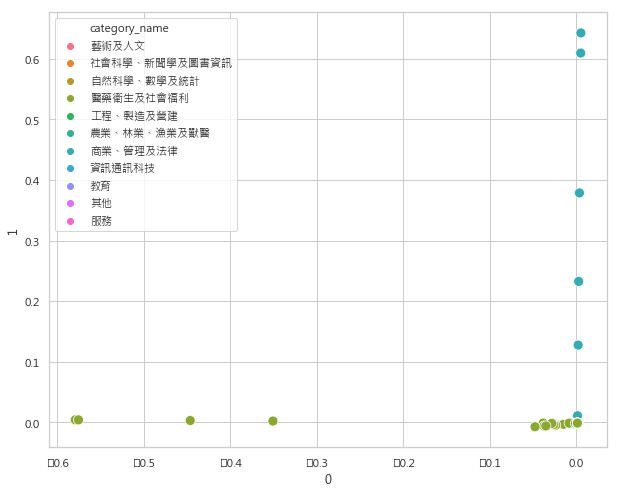

In [37]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=0, y=1, s=100,data=newdata,hue="category_name")

In [43]:
#這張圖主要把領域分成2類，但與PCA做出來的結果不太相同，所有類別擠在一起的情況比較沒有那麼嚴重(跟前一張圖有點類似)

(3) Perform PCA transformation first, and use the first 100 principle components as the input to LLE (with 20 neighbors)

In [39]:
pca=PCA(n_components=100)
pcadata=pca.fit_transform(final)
embedding = LocallyLinearEmbedding(n_components=2,n_neighbors=20)
lledata=embedding.fit_transform(pcadata)
lledata=pd.DataFrame(lledata)
lledata.index=final.index

In [40]:
newdata=pd.merge(lledata,uname[["department_id","category_name"]],on='department_id')
newdata=newdata.set_index("department_id")
newdata.head()

,0,1,category_name
department_id,,,
001012,-0.002534,-0.000222,藝術及人文
001022,-0.000347,0.002238,藝術及人文
001032,-0.002286,0.000174,藝術及人文
001042,-0.003253,-0.000602,藝術及人文
001052,-0.003292,-0.000509,藝術及人文


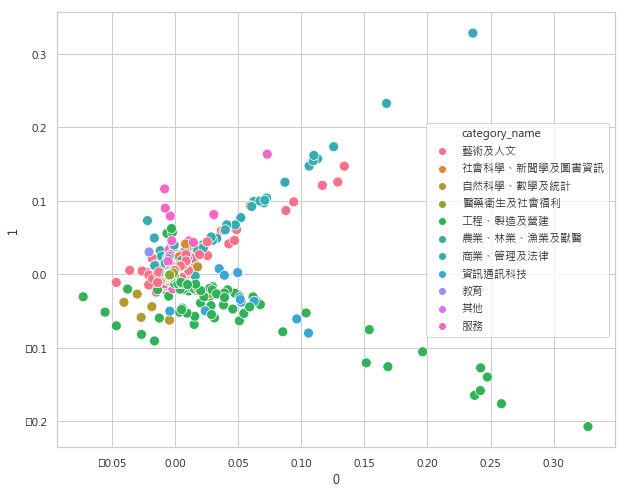

In [41]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=0, y=1, s=100,data=newdata,hue="category_name")

In [42]:
#經過PCA轉換後再帶入LLE後，某些領域分布的pattern比較看的出來，但是還是有很多類別都聚集在一起

Q2.4: Visualize academic department using Kernel PCA. You should at least consider the RBF and Cosine kernel. It is your responsibility to select reasonably good kernel parameters. Discuss the result.

In [62]:
from sklearn.decomposition import KernelPCA
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV
def my_scorer(estimator, X, y=None):
    X_reduced = estimator.transform(X)
    X_preimage = estimator.inverse_transform(X_reduced)
    return -1 * mean_squared_error(X, X_preimage)
param_grid = [{
        "gamma":[0.001,0.01,0.1,1,10,100,1000]
    }]
kpca=KernelPCA(fit_inverse_transform=True,n_components=2, kernel='rbf') 
grid_search = GridSearchCV(kpca, param_grid, cv=3, scoring=my_scorer)
grid_search.fit(final)

GridSearchCV(cv=3, error_score='raise',
       estimator=KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
     fit_inverse_transform=True, gamma=None, kernel='rbf',
     kernel_params=None, max_iter=None, n_components=2, n_jobs=1,
     random_state=None, remove_zero_eig=False, tol=0),
       fit_params=None, iid=True, n_jobs=1,
       param_grid=[{'gamma': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=<function my_scorer at 0x00000221BFCAAEA0>, verbose=0)

In [64]:
grid_search.best_estimator_

KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
     fit_inverse_transform=True, gamma=0.01, kernel='rbf',
     kernel_params=None, max_iter=None, n_components=2, n_jobs=1,
     random_state=None, remove_zero_eig=False, tol=0)

In [65]:
kernelpca = KernelPCA(n_components=2, kernel='rbf',alpha=1.0, coef0=1,gamma=0.01)
kpcadata=kernelpca.fit_transform(final)
kpcadata=pd.DataFrame(kpcadata)
kpcadata.index=final.index

In [66]:
newdata=pd.merge(kpcadata,uname[["department_id","category_name"]],on='department_id')
newdata=newdata.set_index("department_id")
newdata.head()

,0,1,category_name
department_id,,,
001012,-0.093146,0.007803,藝術及人文
001022,0.173221,0.023751,藝術及人文
001032,-0.009204,0.007871,藝術及人文
001042,-0.121229,0.008723,藝術及人文
001052,-0.210840,0.006895,藝術及人文


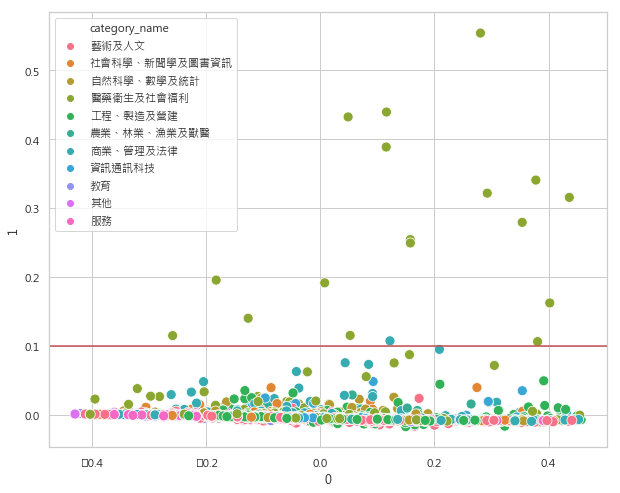

In [74]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=0, y=1, s=100,data=newdata,hue="category_name")
plt.axhline(y=0.1, color='r', linestyle='-')
#幾乎所有類別都黏在一起，只有醫藥衛生及社會福利類跟其他領域比較分的開

In [75]:
param_grid = [{
        "gamma":[0.001, 0.01, 0.1, 1, 10, 100, 1000]
    }]
kpca=KernelPCA(fit_inverse_transform=True,n_components=2, kernel='cosine') 
grid_search = GridSearchCV(kpca, param_grid, cv=3, scoring=my_scorer)
grid_search.fit(final)

GridSearchCV(cv=3, error_score='raise',
       estimator=KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
     fit_inverse_transform=True, gamma=None, kernel='cosine',
     kernel_params=None, max_iter=None, n_components=2, n_jobs=1,
     random_state=None, remove_zero_eig=False, tol=0),
       fit_params=None, iid=True, n_jobs=1,
       param_grid=[{'gamma': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}],
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=<function my_scorer at 0x00000221BFCAAEA0>, verbose=0)

In [76]:
grid_search.best_estimator_

KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
     fit_inverse_transform=True, gamma=0.001, kernel='cosine',
     kernel_params=None, max_iter=None, n_components=2, n_jobs=1,
     random_state=None, remove_zero_eig=False, tol=0)

In [77]:
kernelpca = KernelPCA(n_components=2, kernel='cosine',alpha=1.0, coef0=1,gamma=0.001)
kpcadata=kernelpca.fit_transform(final)
kpcadata=pd.DataFrame(kpcadata)
kpcadata.index=final.index

In [78]:
newdata=pd.merge(kpcadata,uname[["department_id","category_name"]],on='department_id')
newdata=newdata.set_index("department_id")
newdata.head()

,0,1,category_name
department_id,,,
001012,-0.011949,0.034091,藝術及人文
001022,-0.052217,0.065792,藝術及人文
001032,-0.013249,0.038290,藝術及人文
001042,-0.019058,0.037534,藝術及人文
001052,-0.014120,0.030136,藝術及人文


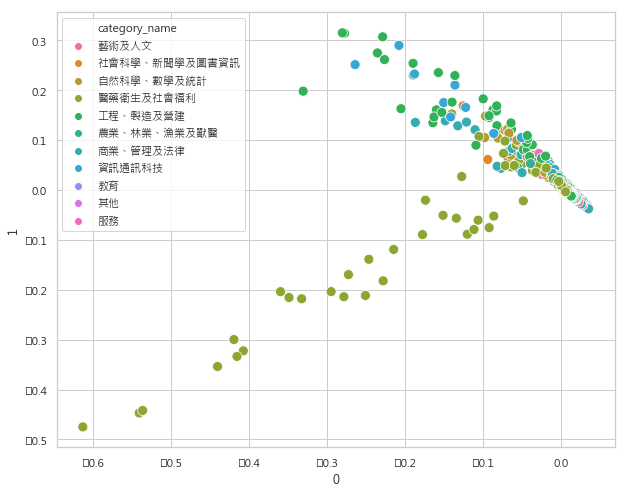

In [84]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=0, y=1, s=100,data=newdata,hue="category_name")
#跟上張圖一樣的問題，幾乎所有類別都黏在一起，只有醫藥衛生及社會福利類比較能跟別人分的開

Q2.5: Visualize academic department using t-SNE. You should consider at least the Euclidian, Cosine, and Jaccard metric. Set numpy random seed so that your results can be repeated. Discuss the result.

In [35]:
from sklearn.manifold import TSNE
tsnedata=TSNE(n_components=2,metric="euclidean",random_state=0,perplexity=100).fit_transform(final)
tsnedata=pd.DataFrame(tsnedata)
tsnedata.index=final.index

In [36]:
newdata=pd.merge(tsnedata,uname[["department_id","category_name"]],on='department_id')
newdata=newdata.set_index("department_id")
newdata.head(5)

,0,1,category_name
department_id,,,
001012,0.725557,1.114052,藝術及人文
001022,1.759853,-1.203491,藝術及人文
001032,0.717340,0.698886,藝術及人文
001042,-0.457609,0.374232,藝術及人文
001052,0.449346,-0.535788,藝術及人文


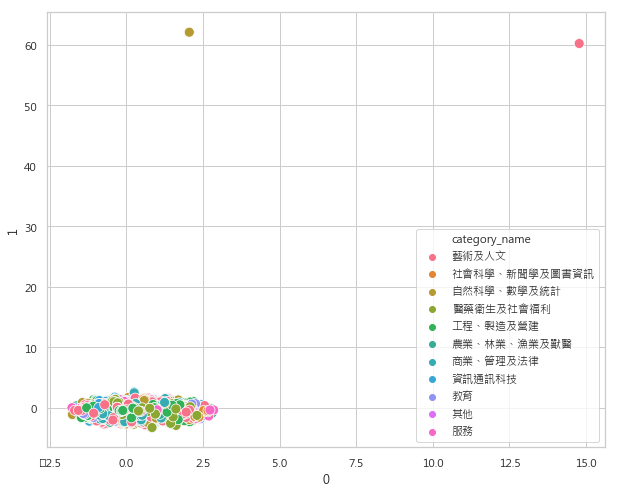

In [51]:
fig=plt.figure(figsize=(10,8))
sns.scatterplot(x=0, y=1, s=100,data=newdata,hue="category_name")

In [52]:
tsnedata=TSNE(n_components=2,metric="cosine",random_state=1).fit_transform(final)
tsnedata=pd.DataFrame(tsnedata)
tsnedata.index=final.index

In [53]:
newdata=pd.merge(tsnedata,uname[["department_id","category_name"]],on='department_id')
newdata=newdata.set_index("department_id")
newdata.head(5)

,0,1,category_name
department_id,,,
001012,9.891279,-44.035202,藝術及人文
001022,4.580845,-46.031181,藝術及人文
001032,11.055134,-44.399448,藝術及人文
001042,11.688371,-43.821831,藝術及人文
001052,11.774877,-45.531124,藝術及人文


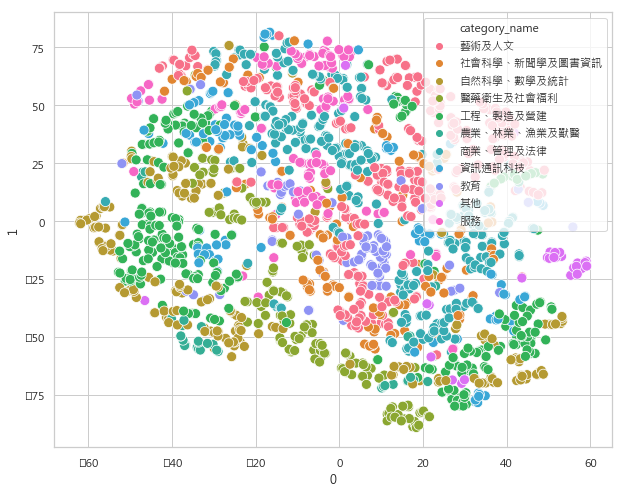

In [54]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=0, y=1, s=100,data=newdata,hue="category_name")

In [58]:
tsnedata=TSNE(n_components=2,metric="jaccard",random_state=1).fit_transform(final)
tsnedata=pd.DataFrame(tsnedata)
tsnedata.index=final.index

In [59]:
newdata=pd.merge(tsnedata,uname[["department_id","category_name"]],on='department_id')
newdata=newdata.set_index("department_id")
newdata.head(5)

,0,1,category_name
department_id,,,
001012,-3.833046,-56.779568,藝術及人文
001022,2.260304,-53.263836,藝術及人文
001032,-4.297401,-57.747662,藝術及人文
001042,-5.159360,-57.966228,藝術及人文
001052,-3.664651,-58.967892,藝術及人文


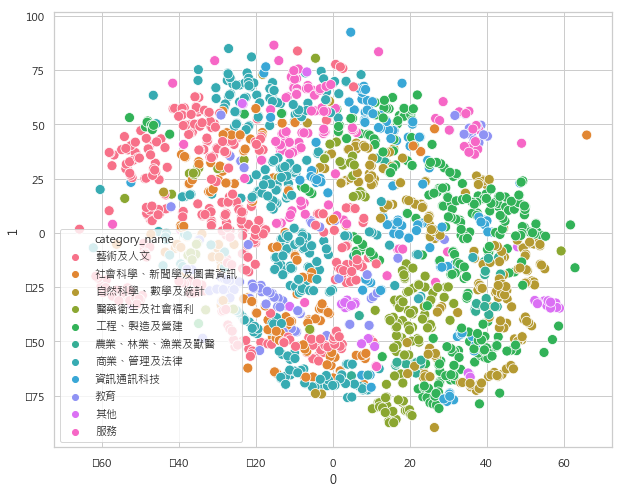

In [60]:
plt.figure(figsize=(10,8))
sns.scatterplot(x=0, y=1, s=100,data=newdata,hue="category_name")

In [61]:
#使用 tsne的方法時，若用Euclidian 來衡量距離，整體的結果會有些失真(很多點聚集在一個很小的區域結成一團)
#而用Jaccard指標時，不同類型的領域感覺比較有辦法從圖形上區分(每個類型一團一團的散布)

Question 3 [Refine]

(30%) Select the most promising visualization method in the previous question and refine the result. Your should color points by department category. Label each data point with its name so that we can easily identify a data point on the picture. Moreover, you should try to reduce the problem caused by overlapping points and labels. Output a picture that is large enough so that a user can easily identify a department and its neighbors. Jupyter Notebook has limitations on the largest picture size. To overcome this problem, consider output the picture to a separate file and submit the file for grading. Your score depends on how useful, readable, and visually pleasing of your visualization results.

In [17]:
from sklearn.manifold import TSNE
tsnedata=TSNE(n_components=2,metric="jaccard",random_state=1).fit_transform(final)
tsnedata=pd.DataFrame(tsnedata)
tsnedata.index=final.index

In [18]:
newdata=pd.merge(tsnedata,uname[["department_id","category_name","school_name_abbr","department_name_abbr"]],on='department_id')
newdata=newdata.set_index("department_id")
newdata.head(5)

,0,1,category_name,school_name_abbr,department_name_abbr
department_id,,,,,
001012,-3.833046,-56.779568,藝術及人文,臺大,中文
001022,2.260304,-53.263836,藝術及人文,臺大,外文
001032,-4.297401,-57.747662,藝術及人文,臺大,歷史
001042,-5.159360,-57.966228,藝術及人文,臺大,哲學
001052,-3.664651,-58.967892,藝術及人文,臺大,人類學系


In [19]:
newdata["field"]=newdata["school_name_abbr"]+newdata["department_name_abbr"]
newdata.head()

,0,1,category_name,school_name_abbr,department_name_abbr,field
department_id,,,,,,
001012,-3.833046,-56.779568,藝術及人文,臺大,中文,臺大中文
001022,2.260304,-53.263836,藝術及人文,臺大,外文,臺大外文
001032,-4.297401,-57.747662,藝術及人文,臺大,歷史,臺大歷史
001042,-5.159360,-57.966228,藝術及人文,臺大,哲學,臺大哲學
001052,-3.664651,-58.967892,藝術及人文,臺大,人類學系,臺大人類學系


In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
#color points by department category. Label each data point with its name.
fig=plt.figure(figsize=(200,200))
pl=sns.scatterplot(x=0, y=1, s=2000,data=newdata,hue="category_name")
plt.legend(loc='best')
for line in range(0,newdata.shape[0]):
    pl.text(newdata[0][line]+0.2, newdata[1][line], newdata["field"][line], horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend(prop={'size': 60},markerscale=5)
plt.title("不同領域在二維空間的視覺化分布",fontsize=100)
plt.show()

fig.savefig('plot.png')